In [1]:
import warnings
warnings.filterwarnings('ignore')
import picaso.justdoit as jdi
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## What is this part of Picaso trying to do?

This is the tutorial to run a 1D Radiative-Convective Equilibrium Model to solve for atmospheric structures of brown dwarfs and exoplanets. A brown dwarf or exoplanet atmosphere can be divided into different physical components :-

1\. The Temperature Structure (T(P) profile)
 
2\. The Chemical Structure 

3\. Energy Transport in the atmosphere (Radiative Transfer)

4\. Clouds 

But these physical components are not independent of each other. For example, the chemistry is dependant on the T(P) profile, the radiative transfer is dependant on clouds and the chemistry and so on. 

This code here tries to find the atmospheric state of your object by taking care of all of these processes and their interconnections self-consistently.

So lets begin ...




## Let's first try to model a brown dwarf you are perhaps interested in

What are the properties of your brown dwarf of interest ? What is its effective temperature and what is its gravity ? 

In [2]:
T_eff= 1000 # Effective Temperature of your Brown Dwarf in K
grav = 1000 # Gravity of your brown dwarf in m/s/s

cl_run = jdi.inputs(calculation="brown", climate = True) # start a calculation 

#note you need to put the climate keyword to be True in order to do so
# now you need to add these parameters to your calculation  

cl_run.gravity(gravity=grav, gravity_unit=u.Unit('m/(s**2)')) # input gravity
cl_run.T_eff(Teff=T_eff) # input effective temperature



T_star = "NA" # K, As it is a isolated brown dwarf, these params are not needed so 'NA'
semi_major = "NA" # AU,  As it is a isolated brown dwarf, these params are not needed so 'NA'
# ignore this for now
self_consistent_kzz= False # Only needed if you want to do on-the-fly calculation with MLT Kzz



Let's now grab our gaseos opacities. This code uses a correlated-k approach for dealing with opacities. In order to do that, you must decide what is the metallicity of the atmosphere you are going after and what is the CtoO ratio. Note how the opannection function is run with different keywords now.

In [3]:
mh = '+0.0' #log metallicity
CtoO = '1.0' # CtoO ratio

# Connect to your opacity databases. These databases are the backbone of the code
filename_db="/Users/sagnickmukherjee/Documents/GitHub/picaso-dev/reference/opacities/ck_cx_cont_opacities.db"
ck_db='/Users/sagnickmukherjee/Documents/software/picaso-dev/reference/opacities/ck_db/m'+mh+'_co'+CtoO+'.data.196'

# Notice The keyword ck is set to True because you want to use the correlated-k opacities for your calculation
# and not the line by line opacities
opacity_ck = jdi.opannection(ck=True, ck_db=ck_db,filename_db=filename_db) # grab your opacities


As is always the case with models, you also need to set-up a grid to do all your calculations. Here you need to divide the atmosphere of your object in 1D plane-parallel levels. We recommend any number of levels between 51-91 depending on your needs. Then you also need to decide the physical extent of the atmosphere this grid belongs to. 

Intuitively, you might think as this grid to be of vertical height but our model uses a grid of atmospheric pressure instead. 

Low pressure -----> upper Atmosphere

High pressure -----> Deeper Atmosphere

Therefore, you need to specify the maximum pressure and minimum pressure of your atmospheric grid

In [4]:
nlevel = 91 # number of plane-parallel levels in your code

#Lets set the max and min at 1e-4 bars and 500 bars

Pmin = 1e-4 #bars
Pmax = 500 #bars
pressure=np.logspace(np.log10(Pmin),np.log10(Pmax),nlevel) # set your pressure grid


You also need to assume a guess temperature pressure profile to start things off with the code. A good go-to guess always is the published SONORA grid. But lets start things off with a very bad guess of an isothermal atmosphere.

In [5]:
temp_guess = np.zeros(shape=(nlevel))

temp_guess += 500 # K , isothermal atmosphere guess


You also need to have a crude guess of the convective zone of your atmosphere. Generally the deeper atmosphere is always convective. Again a good guess is always the published SONORA grid of models for this. But lets assume that the bottom 7 levels of the atmosphere is convective. 

In [6]:

    
nofczns = 1 # number of convective zones initially, don't change this 

nstr_upper = 83 # top most level of guessed convective zone
nstr_deep = nlevel -2 # this is always the case. Dont change this
nstr = np.array([0,nstr_upper,nstr_deep,0,0,0]) # initial guess of convective zones

# Here are some other parameters needed for the code.
rfacv = 0.0 # This is for stellar incident radiation. This is zero for brown dwarfs as we are not concerned with stellar radiation.
rfaci =1.0 # This is 1 always.
cloudy = False # not cloudy
fsed = 0.0 # as not cloudy so won't matter

    

Now we would use the inputs_climate function to input everything together to our cl_run we started.

In [7]:

cl_run.inputs_climate(temp_guess= temp_guess, pressure= pressure, nstr = nstr, nofczns = nofczns , rfacv = rfacv, rfaci = rfaci, cloudy = cloudy, mh = mh, CtoO = CtoO,species = ['MgSiO3','Mg2SiO4','Fe'], fsed = fsed)


 The actual climate code can be run with the cl_run.run command. The save_all_profiles is set to True to save the T(P) profile at all steps. The code will now iterate from your guess to reach the correct atmospheric solution for your brown dwarf of interest.
 Okay !!! We are all set to do our run. Let's hope for the best...
 
 

In [8]:
pressure , temp, dtdp, nstr_new, flux_plus_final, df, all_profiles = cl_run.run_climate_model(opacity_ck,save_all_profiles=True, save_all_kzz = False,diseq_chem = False, self_consistent_kzz =self_consistent_kzz,vulcan_run = False)


Iteration number  0 , min , max temp  499.9803992111771 834.559044057119 , flux balance  -0.9373698447723755
Iteration number  1 , min , max temp  499.89374640209024 1100.2270936349573 , flux balance  -0.9363378812492744
Iteration number  2 , min , max temp  499.0064919810326 1964.6701233402143 , flux balance  -0.7178777958017392
Iteration number  3 , min , max temp  487.96995638081705 2011.4074498290968 , flux balance  -0.6387334665428086
Iteration number  4 , min , max temp  448.8220932143005 2135.9798367592352 , flux balance  -0.3344995690385945
Iteration number  5 , min , max temp  353.3516000612241 2252.0117275288017 , flux balance  0.05858859270863878
Iteration number  6 , min , max temp  290.9399846034618 2239.599160837443 , flux balance  0.004557772196979548
Iteration number  7 , min , max temp  253.82236139008148 2238.5621701897794 , flux balance  0.00027727071950230683
Iteration number  8 , min , max temp  239.0332496972572 2238.496749097322 , flux balance  1.6682895647674455

Big iteration is  343.6012571765111 0
 We are already at a root, tolf , test =  5e-05 ,  3.417329658051871e-05
Profile converged
YAY ! ENDING WITH CONVERGENCE


 Let's see how our run tallies with the SONORA bobcat published models

Text(0.5, 1.0, 'T$_{\\rm eff}$= 1000 K, log(g)=5.0')

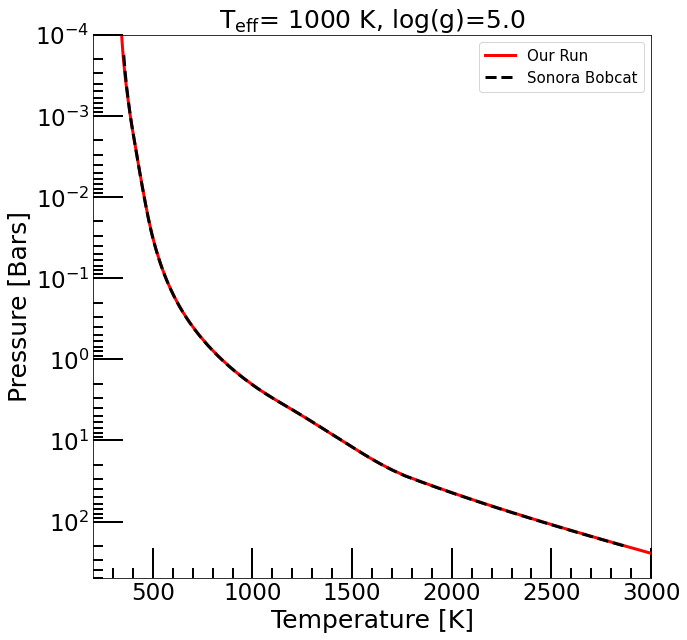

In [9]:
pressure_bobcat,temp_bobcat = np.loadtxt("/Users/sagnickmukherjee/Documents/GitHub/Disequilibrium-Picaso/t"+str(1000)+"g1000"+"nc_m0.0.dat",usecols=[1,2],unpack=True, skiprows = 1)

plt.figure(figsize=(10,10))
plt.ylabel("Pressure [Bars]", fontsize=25)
plt.xlabel('Temperature [K]', fontsize=25)
plt.ylim(500,1e-4)
plt.xlim(200,3000)

plt.semilogy(temp,pressure,color="r",linewidth=3,label="Our Run")

plt.semilogy(temp_bobcat,pressure_bobcat,color="k",linestyle="--",linewidth=3,label="Sonora Bobcat")


plt.minorticks_on()
plt.tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=23)
plt.tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=23)

plt.legend(fontsize=15)

plt.title(r"T$_{\rm eff}$= 1000 K, log(g)=5.0",fontsize=25)



We can also try to see how our initial guess of an isothermal atmosphere was changed by the code to reach the converged solution

In [10]:
# lets copy our outputs first to new arrays so that we accidentally don't change anything while 
# doing our animation on the original outputs otherwise will have to rerun the time consuming code again

t_eq,p_eq,df_eq,all_profiles_eq = np.copy(temp), np.copy(pressure), df,np.copy(all_profiles)

In [11]:
co,h2o,nh3,ch4 = np.zeros(len(all_profiles_eq)),np.zeros(len(all_profiles_eq)),np.zeros(len(all_profiles_eq)),np.zeros(len(all_profiles_eq))
spec = np.zeros(shape =(int(len(all_profiles_eq)/91),196))
for i in range(int(len(all_profiles_eq)/91)):
#for i in range(5):
    bd = jdi.inputs(calculation='brown')

    bd.phase_angle(0)
    bd.gravity(gravity=1000 , gravity_unit=u.Unit('m/s**2'))

    sonora_profile_db = '/Users/sagnickmukherjee/Documents/software/sonora/profile/'
    Teff_dummy = 1000
    bd.sonora(sonora_profile_db, Teff_dummy)
    
    bd.inputs['atmosphere']['profile']['pressure'] =p_eq
    bd.inputs['atmosphere']['profile']['temperature'] = all_profiles_eq[i*91:(i+1)*91]
    bd.premix_atmosphere(opacity_ck,bd.inputs['atmosphere']['profile'])
    
    df_spec = bd.spectrum(opacity_ck,full_output=True)
    spec[i,:] = df_spec['thermal']
    co[i*91:(i+1)*91] = bd.inputs['atmosphere']['profile']['CO']
    h2o[i*91:(i+1)*91] = bd.inputs['atmosphere']['profile']['H2O']
    nh3[i*91:(i+1)*91] = bd.inputs['atmosphere']['profile']['NH3']
    ch4[i*91:(i+1)*91] = bd.inputs['atmosphere']['profile']['CH4']
    #x,y = jdi.mean_regrid(1e4/df_spec['wavenumber'], df_spec['thermal'], R=500)
    
wh = np.where( (1e4/df_spec['wavenumber'] > 0.0) & (1e4/df_spec['wavenumber'] < 6))
wv = 1e4/df_spec['wavenumber'][wh]    
    



Lets run the animation code now

In [12]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

writergif = animation.PillowWriter(fps=3) 
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"


x='''
AA.BB.CC
'''
fig = plt.figure(figsize=(35,10))

ax = fig.subplot_mosaic(x,gridspec_kw={
        # set the height ratios between the rows
        "height_ratios": [1],
        # set the width ratios between the columns
        "width_ratios": [1,1,0.1,1,1,0.1,1,1]})

temp = all_profiles_eq[0*91:(0+1)*91]
line0, = ax['A'].semilogy(temp_bobcat,pressure_bobcat,color="k",linestyle="--",linewidth=3)
line, = ax['A'].semilogy(temp, p_eq,linewidth=3,color='r')
line1, = ax['B'].loglog(co[0:91], p_eq,linewidth=3,color='g',label="CO")
line2, = ax['B'].loglog(ch4[0:91], p_eq,linewidth=3,color='b',label="CH$_4$")
line3, = ax['C'].semilogy(1e4/df_spec['wavenumber'], spec[0,:],linewidth=3,color="r")
line4, = ax['B'].loglog(h2o[0:91], p_eq,linewidth=3,color='pink',label="H$_2$O")
line5, = ax['B'].loglog(nh3[0:91], p_eq,linewidth=3,color='salmon',label="NH$_3$")

def init():
    #line.set_ydata(np.ma.array(x, mask=True))
    
    ax['A'].set_xlabel('Temperature [K]',fontsize=30)
    ax['A'].set_ylabel('Pressure [Bars]',fontsize=30)
    ax['A'].set_xlim(200,2900)
    ax['A'].set_ylim(205,1.8e-4)
    ax['B'].set_xlabel('Abundance [V/V]',fontsize=30)
    ax['B'].set_ylabel('Pressure [Bars]',fontsize=30)
    ax['B'].set_xlim(1e-6,1e-2)
    ax['B'].set_ylim(205,1.8e-4)
    ax['B'].legend(fontsize=20)
    ax['C'].set_xlabel('Wavelength [$\mu$m]',fontsize=30)
    ax['C'].set_ylabel('Flux',fontsize=30)
    ax['C'].set_xlim(0,6)
    ax['C'].set_ylim(1e7,1e14)
    ax['A'].minorticks_on()
    ax['A'].tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=30)
    ax['A'].tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=30)
    ax['B'].minorticks_on()
    ax['B'].tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=30)
    ax['B'].tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=30)
    ax['C'].minorticks_on()
    ax['C'].tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=30)
    ax['C'].tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=30)
    
    line.set_ydata(p_eq)
    line1.set_ydata(p_eq)
    line2.set_ydata(p_eq)
    line3.set_xdata(wv)
    line4.set_ydata(p_eq)
    line5.set_ydata(p_eq)
    
    #time_text.set_text('')
    return line,line1,line2,line3,line4,line5#,time_text        #return the variables that will updated in each frame
    
def animate(i):                  # 'i' is the number of frames  
    line.set_xdata(all_profiles_eq[i*91:(i+1)*91])
    line1.set_xdata(co[i*91:(i+1)*91])
    line2.set_xdata(ch4[i*91:(i+1)*91])
    line3.set_ydata(spec[i,:][wh])# update the data
    line4.set_xdata(h2o[i*91:(i+1)*91])
    line5.set_xdata(nh3[i*91:(i+1)*91])
    #time_text.set_text(' frame number = %.1d' % i)  
    return line,line1,line2,line3,line4,line5

ani = animation.FuncAnimation(fig, animate, frames=int(len(all_profiles_eq)/91),init_func=init,interval=50, blit=False)
plt.close()
ani
#ani.save('Benchmarking/anim.gif', writer=writergif)

1) Was our choice of the pressure grid correct?

If your pressure grid is such that one can basically look through your atmosphere till the bottom then your grid is not correct and the converged solution are also not correct. This looking through might happen if we do not go deep enough in the atmosphere pressure grid. Then in wavelengths where gas/continuum opacities are low, one can look to the bottom of your model which is not good.


A good way to check this is by calculation of the brightness temperature of the emergent spectrum from your converged model. Brightness temperature of your thermal spectra at a certain wavelength gives you a rough measure of the temperature responsible for the flux you are seeing at that wavelength. Note that this temperature doesn't need to be the physical temperature of your atmosphere but if you can find the physical converged atmospheric temperature closest to this brightness temperature you can also get an idea of the atmospheric pressure from where the flux you are seeing is originating from.

$T_{\rm bright}=\dfrac{a}{{\lambda}log\left(\dfrac{{b}}{F(\lambda){\lambda}^5}+1\right)}$

where a = 1.43877735$\times$10$^{-2}$ m.K and b = 11.91042952$\times$10$^{-17}$ m$^4$kg/s$^3$ 

Let's calculate the brigthness temperature of our current run and check if our pressure grid was okay.

In [18]:

def brightnessT(lam,flux):
    a=1.43877735e-2  #m K
    hc2=2*5.95521476e-17   # m^4 kg/s^3
    ## since flux is in W/m^2/microns hence need to multiple 1e6 to the flux to make it W/m^2/m
    flux=flux*1e6
    ## converting wv to m from microns
    lam=lam*1e-6
    
    return (a/lam)/np.log(1+(hc2/flux/lam**5))



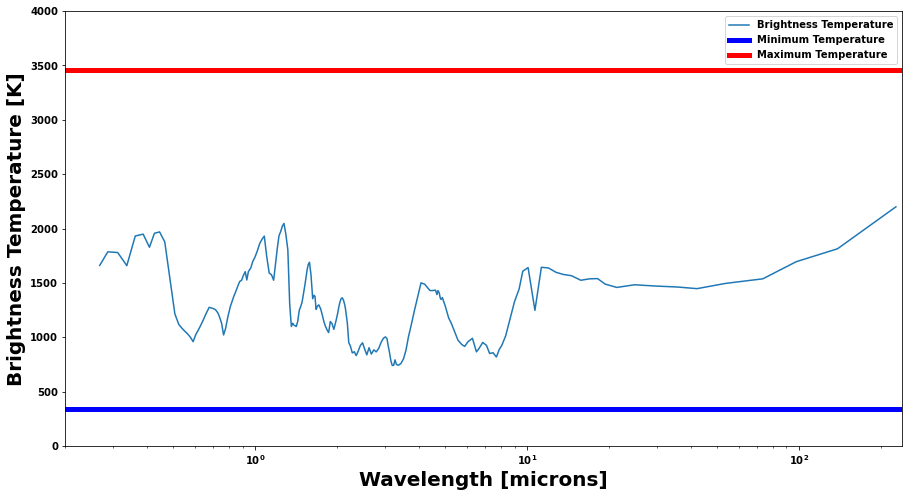

In [31]:
T_B = brightnessT(1e4/df_spec['wavenumber'],1e-7*spec[-1,:])

plt.figure(figsize=(15,8))
plt.xlabel("Wavelength [microns]",fontsize=20)
plt.ylabel("Brightness Temperature [K]",fontsize=20)
plt.xlim(0.2,240)
plt.ylim(0,4000)


plt.semilogx(1e4/df_spec['wavenumber'],T_B,label="Brightness Temperature")
plt.axhline(np.min(t_eq),linewidth=5,color="blue",label="Minimum Temperature")
plt.axhline(np.max(t_eq),linewidth=5,color="red",label="Maximum Temperature")

plt.legend(fontsize=10)

So our run was good and our choice of the pressure grid is also great. Well done team !

But let's check out a run which is not okay so that we are cautious while using the code. Let's do the same run by the max pressure set at only 30 bars instead of 500 bars.

In [62]:

T_eff= 1000 # Effective Temperature of your Brown Dwarf in K
grav = 1000 # Gravity of your brown dwarf in m/s/s

cl_run_nok = jdi.inputs(calculation="brown", climate = True) # start a calculation 

#note you need to put the climate keyword to be True in order to do so
# now you need to add these parameters to your calculation  

cl_run_nok.gravity(gravity=grav, gravity_unit=u.Unit('m/(s**2)')) # input gravity
cl_run_nok.T_eff(Teff=T_eff) # input effective temperature



T_star = "NA" # K, As it is a isolated brown dwarf, these params are not needed so 'NA'
semi_major = "NA" # AU,  As it is a isolated brown dwarf, these params are not needed so 'NA'
# ignore this for now
self_consistent_kzz= False # Only needed if you want to do on-the-fly calculation with MLT Kzz



nlevel = 91 # number of plane-parallel levels in your code

#Lets set the max and min at 1e-4 bars and 500 bars

Pmin = 1e-4 #bars
Pmax = 3 #bars   #CHANGED HERE
pressure=np.logspace(np.log10(Pmin),np.log10(Pmax),nlevel) # set your pressure grid

temp_guess = np.zeros(shape=(nlevel))

temp_guess += 500

nofczns = 1 # number of convective zones initially, don't change this 

nstr_upper = 88 # top most level of guessed convective zone
nstr_deep = nlevel -2 # this is always the case. Dont change this
nstr = np.array([0,nstr_upper,nstr_deep,0,0,0]) # initial guess of convective zones

# Here are some other parameters needed for the code.
rfacv = 0.0 # This is for stellar incident radiation. This is zero for brown dwarfs as we are not concerned with stellar radiation.
rfaci =1.0 # This is 1 always.
cloudy = False # not cloudy
fsed = 0.0 # as not cloudy so won't matter



cl_run_nok.inputs_climate(temp_guess= temp_guess, pressure= pressure, nstr = nstr, nofczns = nofczns , rfacv = rfacv, rfaci = rfaci, cloudy = cloudy, mh = mh, CtoO = CtoO,species = ['MgSiO3','Mg2SiO4','Fe'], fsed = fsed)


pressure_nok , temp_nok, dtdp_nok, nstr_new_nok, flux_plus_final_nok, df_nok, all_profiles_nok = cl_run_nok.run_climate_model(opacity_ck,save_all_profiles=True, save_all_kzz = False,diseq_chem = False, self_consistent_kzz =self_consistent_kzz,vulcan_run = False)



Iteration number  0 , min , max temp  496.7958450849807 596.3099894122184 , flux balance  -0.8662341275551256
Iteration number  1 , min , max temp  487.5649573462548 718.6689115183623 , flux balance  -0.7527039371012594
Iteration number  2 , min , max temp  479.0028044311723 779.1400540363355 , flux balance  -0.6676395482339036
Iteration number  3 , min , max temp  470.9142178383549 820.0877373388603 , flux balance  -0.5947750897543513
Iteration number  4 , min , max temp  451.29838010024054 896.4466574833114 , flux balance  -0.4116356609921351
Iteration number  5 , min , max temp  383.0894891258439 1034.4898345120841 , flux balance  0.22693978809563453
Iteration number  6 , min , max temp  355.01107279339516 1002.4883048851182 , flux balance  0.025184026101973202
Iteration number  7 , min , max temp  349.6691674537838 998.0895299062983 , flux balance  0.0006584242640647488
Iteration number  8 , min , max temp  349.4927915516589 997.9680792429538 , flux balance  8.3962161127663e-06
Con

Lets plot the profile from our new run and check it against our old run.

Text(0.5, 1.0, 'T$_{\\rm eff}$= 1000 K, log(g)=5.0')

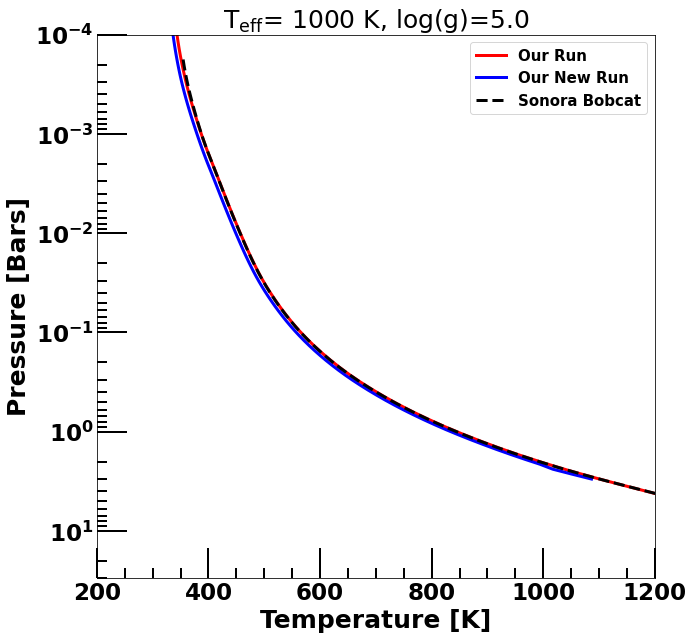

In [63]:
pressure_bobcat,temp_bobcat = np.loadtxt("/Users/sagnickmukherjee/Documents/GitHub/Disequilibrium-Picaso/t"+str(1000)+"g1000"+"nc_m0.0.dat",usecols=[1,2],unpack=True, skiprows = 1)

plt.figure(figsize=(10,10))
plt.ylabel("Pressure [Bars]", fontsize=25)
plt.xlabel('Temperature [K]', fontsize=25)
plt.ylim(30,1e-4)
plt.xlim(200,1200)

plt.semilogy(t_eq,p_eq,color="r",linewidth=3,label="Our Run")
plt.semilogy(temp_nok,pressure_nok,color="b",linewidth=3,label="Our New Run")

plt.semilogy(temp_bobcat,pressure_bobcat,color="k",linestyle="--",linewidth=3,label="Sonora Bobcat")


plt.minorticks_on()
plt.tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=23)
plt.tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=23)

plt.legend(fontsize=15)

plt.title(r"T$_{\rm eff}$= 1000 K, log(g)=5.0",fontsize=25)



This new profile is slightly off from our run and also the sonora bobcat run. Lets look at its brightness temperature as a function of wavelength and check if it matches well with our previous run.

In [64]:
bd = jdi.inputs(calculation='brown')

bd.phase_angle(0)
bd.gravity(gravity=1000 , gravity_unit=u.Unit('m/s**2'))

sonora_profile_db = '/Users/sagnickmukherjee/Documents/software/sonora/profile/'
Teff_dummy = 1000
bd.sonora(sonora_profile_db, Teff_dummy)

bd.inputs['atmosphere']['profile']['pressure'] =pressure_nok
bd.inputs['atmosphere']['profile']['temperature'] = temp_nok
bd.premix_atmosphere(opacity_ck,bd.inputs['atmosphere']['profile'])

df_spec_nok = bd.spectrum(opacity_ck,full_output=True)

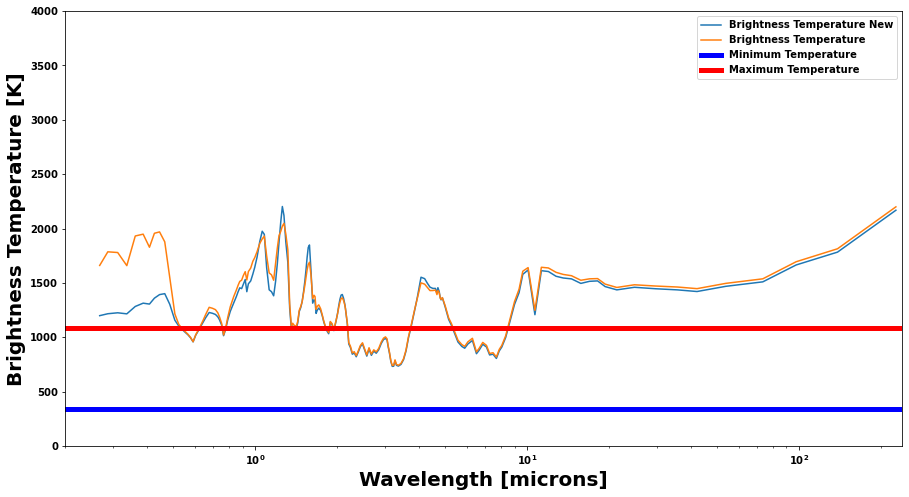

In [65]:
T_B = brightnessT(1e4/df_spec['wavenumber'],1e-7*spec[-1,:])
T_B_nok = brightnessT(1e4/df_spec['wavenumber'],1e-7*df_spec_nok['thermal'])

plt.figure(figsize=(15,8))
plt.xlabel("Wavelength [microns]",fontsize=20)
plt.ylabel("Brightness Temperature [K]",fontsize=20)
plt.xlim(0.2,240)
plt.ylim(0,4000)


plt.semilogx(1e4/df_spec['wavenumber'],T_B_nok,label="Brightness Temperature New")
plt.semilogx(1e4/df_spec['wavenumber'],T_B,label="Brightness Temperature")

plt.axhline(np.min(temp_nok),linewidth=5,color="blue",label="Minimum Temperature")
plt.axhline(np.max(temp_nok),linewidth=5,color="red",label="Maximum Temperature")

plt.legend(fontsize=10)

See how the brightness temperature from this new run is different from our previous succesful run. The brightness temperatures infact go over the maximum temperature achieved by the model. Therefore the pressure grid used for this run is incorrect because one can look through the atmosphere to the bottom of the grid at most wavelengths which is not good and the resultant `converged' T(P) profile is also visibly inaccurate as a result as well.

#  Okay lets get back to our correct run and analyze it a bit more.